### What You Should Already Know

- neural networks, forward and back-propagation
- stochastic gradient descent
- mean squared error
- and train/test splits

### Where to Get Help if You Need it
- Re-watch previous Udacity Lectures
- Leverage the recommended Course Reading Material - [Grokking Deep Learning](https://www.manning.com/books/grokking-deep-learning) (Check inside your classroom for a discount code)
- Shoot me a tweet @iamtrask


### Tutorial Outline:

- Intro: The Importance of "Framing a Problem" (this lesson)

- [Curate a Dataset](#lesson_1)
- [Developing a "Predictive Theory"](#lesson_2)
- [**PROJECT 1**: Quick Theory Validation](#project_1)


- [Transforming Text to Numbers](#lesson_3)
- [**PROJECT 2**: Creating the Input/Output Data](#project_2)


- Putting it all together in a Neural Network (video only - nothing in notebook)
- [**PROJECT 3**: Building our Neural Network](#project_3)


- [Understanding Neural Noise](#lesson_4)
- [**PROJECT 4**: Making Learning Faster by Reducing Noise](#project_4)


- [Analyzing Inefficiencies in our Network](#lesson_5)
- [**PROJECT 5**: Making our Network Train and Run Faster](#project_5)


- [Further Noise Reduction](#lesson_6)
- [**PROJECT 6**: Reducing Noise by Strategically Reducing the Vocabulary](#project_6)


- [Analysis: What's going on in the weights?](#lesson_7)

# Lesson: Curate a Dataset<a id='lesson_1'></a>
The cells from here until Project 1 include code Andrew shows in the videos leading up to mini project 1. We've included them so you can run the code along with the videos without having to type in everything.

In [174]:
def pretty_print_review_and_label(i):
    print(labels[i] + "\t:\t" + reviews[i][:150]  + "...")

g = open('\deep-learning-master\sentiment-network\\reviews.txt','r')
reviews = list(map(lambda x:x[:-1],g.readlines()))
g.close()

g = open('\deep-learning-master\sentiment-network\\labels.txt','r')
labels = list(map(lambda x:x[:-1].upper(),g.readlines()))
g.close()

print(reviews[1])

story of a man who has unnatural feelings for a pig . starts out with a opening scene that is a terrific example of absurd comedy . a formal orchestra audience is turned into an insane  violent mob by the crazy chantings of it  s singers . unfortunately it stays absurd the whole time with no general narrative eventually making it just too off putting . even those from the era should be turned off . the cryptic dialogue would make shakespeare seem easy to a third grader . on a technical level it  s better than you might think with some good cinematography by future great vilmos zsigmond . future stars sally kirkland and frederic forrest can be seen briefly .  


In [2]:
labels[1]

'NEGATIVE'

In [3]:
a = open('ToyText.txt', 'r')

b = list(map(lambda x: x[:-1], a.readlines()))
a.close()
print(b)

['story of a man who has unnatural feelings for a pig . starts out with a opening scene that is a terrific example of absurd comedy . a formal orchestra audience is turned into an insane  violent mob by the crazy chantings of it  s singers . unfortunately it stays absurd the whole time with no general narrative eventually making it just too off putting . even those from the era should be turned off . the cryptic dialogue would make shakespeare seem easy to a third grader . on a technical level it  s better than you might think with some good cinematography by future great vilmos zsigmond . future stars sally kirkland and frederic forrest can be seen briefly .']


In [4]:
x = [1,2,3,4,5,6]

x[:-1]

[1, 2, 3, 4, 5]

**Note:** The data in `reviews.txt` we're using has already been preprocessed a bit and contains only lower case characters. If we were working from raw data, where we didn't know it was all lower case, we would want to add a step here to convert it. That's so we treat different variations of the same word, like `The`, `the`, and `THE`, all the same way.`

# Lesson: Develop a Predictive Theory<a id='lesson_2'></a>

In [5]:
pretty_print_review_and_label(2134)
pretty_print_review_and_label(222)
pretty_print_review_and_label(3)
pretty_print_review_and_label(10)
pretty_print_review_and_label(25)

POSITIVE	:	one of the best love stories i have ever seen . it is a bit like watching a train wreck in slow motion  but lovely nonetheless . . . big edie and litt...
POSITIVE	:	scott bartlett  s  offon  is nine minutes of pure craziness . it is a full  frontal assault of psychedelic  pulsating  epilepsy  inducing flashing lig...
NEGATIVE	:	airport    starts as a brand new luxury    plane is loaded up with valuable paintings  such belonging to rich businessman philip stevens  james stewar...
POSITIVE	:	this isn  t the comedic robin williams  nor is it the quirky  insane robin williams of recent thriller fame . this is a hybrid of the classic drama wi...
NEGATIVE	:	plot is not worth discussion even if it hints at corruption  murder  power and the rest of thriller related topics . characters are interesting though...


In [6]:
from collections import Counter
import numpy as np

In [7]:
# Create three Counter objects to store positive, negative and total counts
positive_counts = Counter()
negative_counts = Counter()
total_counts = Counter()

In [8]:
for i in range(len(reviews)):
    if labels[i] == 'POSITIVE':
        for word in reviews[i].split(" "):
            positive_counts[word] +=1
            total_counts[word] +=1
    else:
        for word in reviews[i].split(" "):
            negative_counts[word] +=1
            total_counts[word] +=1

In [9]:
positive_counts.most_common()

[('', 550468),
 ('the', 173324),
 ('.', 159654),
 ('and', 89722),
 ('a', 83688),
 ('of', 76855),
 ('to', 66746),
 ('is', 57245),
 ('in', 50215),
 ('br', 49235),
 ('it', 48025),
 ('i', 40743),
 ('that', 35630),
 ('this', 35080),
 ('s', 33815),
 ('as', 26308),
 ('with', 23247),
 ('for', 22416),
 ('was', 21917),
 ('film', 20937),
 ('but', 20822),
 ('movie', 19074),
 ('his', 17227),
 ('on', 17008),
 ('you', 16681),
 ('he', 16282),
 ('are', 14807),
 ('not', 14272),
 ('t', 13720),
 ('one', 13655),
 ('have', 12587),
 ('be', 12416),
 ('by', 11997),
 ('all', 11942),
 ('who', 11464),
 ('an', 11294),
 ('at', 11234),
 ('from', 10767),
 ('her', 10474),
 ('they', 9895),
 ('has', 9186),
 ('so', 9154),
 ('like', 9038),
 ('about', 8313),
 ('very', 8305),
 ('out', 8134),
 ('there', 8057),
 ('she', 7779),
 ('what', 7737),
 ('or', 7732),
 ('good', 7720),
 ('more', 7521),
 ('when', 7456),
 ('some', 7441),
 ('if', 7285),
 ('just', 7152),
 ('can', 7001),
 ('story', 6780),
 ('time', 6515),
 ('my', 6488),
 ('g

In [10]:
negative_counts.most_common()

[('', 561462),
 ('.', 167538),
 ('the', 163389),
 ('a', 79321),
 ('and', 74385),
 ('of', 69009),
 ('to', 68974),
 ('br', 52637),
 ('is', 50083),
 ('it', 48327),
 ('i', 46880),
 ('in', 43753),
 ('this', 40920),
 ('that', 37615),
 ('s', 31546),
 ('was', 26291),
 ('movie', 24965),
 ('for', 21927),
 ('but', 21781),
 ('with', 20878),
 ('as', 20625),
 ('t', 20361),
 ('film', 19218),
 ('you', 17549),
 ('on', 17192),
 ('not', 16354),
 ('have', 15144),
 ('are', 14623),
 ('be', 14541),
 ('he', 13856),
 ('one', 13134),
 ('they', 13011),
 ('at', 12279),
 ('his', 12147),
 ('all', 12036),
 ('so', 11463),
 ('like', 11238),
 ('there', 10775),
 ('just', 10619),
 ('by', 10549),
 ('or', 10272),
 ('an', 10266),
 ('who', 9969),
 ('from', 9731),
 ('if', 9518),
 ('about', 9061),
 ('out', 8979),
 ('what', 8422),
 ('some', 8306),
 ('no', 8143),
 ('her', 7947),
 ('even', 7687),
 ('can', 7653),
 ('has', 7604),
 ('good', 7423),
 ('bad', 7401),
 ('would', 7036),
 ('up', 6970),
 ('only', 6781),
 ('more', 6730),
 ('

As you can see, common words like "the" appear very often in both positive and negative reviews. Instead of finding the most common words in positive or negative reviews, what you really want are the words found in positive reviews more often than in negative reviews, and vice versa. To accomplish this, you'll need to calculate the **ratios** of word usage between positive and negative reviews.

**TODO:** Check all the words you've seen and calculate the ratio of postive to negative uses and store that ratio in `pos_neg_ratios`.
>Hint: the positive-to-negative ratio for a given word can be calculated with `positive_counts[word] / float(negative_counts[word]+1)`. Notice the `+1` in the denominator – that ensures we don't divide by zero for words that are only seen in positive reviews.

In [11]:
pos_neg_ratios = Counter()

for term,cnt in list(total_counts.most_common()):

    if cnt > 100:

        pos_neg_ratio = positive_counts[term]/float(negative_counts[term] + 1)
        pos_neg_ratios[term] = pos_neg_ratio

In [12]:
print("Pos-to-neg ratio for 'the' = {}".format(pos_neg_ratios["the"]))
print("Pos-to-neg ratio for 'amazing' = {}".format(pos_neg_ratios["amazing"]))
print("Pos-to-neg ratio for 'terrible' = {}".format(pos_neg_ratios["terrible"]))

Pos-to-neg ratio for 'the' = 1.0607993145235326
Pos-to-neg ratio for 'amazing' = 4.022813688212928
Pos-to-neg ratio for 'terrible' = 0.17744252873563218


Looking closely at the values you just calculated, we see the following:

* Words that you would expect to see more often in positive reviews – like "amazing" – have a ratio greater than 1. The more skewed a word is toward postive, the farther from 1 its positive-to-negative ratio  will be.
* Words that you would expect to see more often in negative reviews – like "terrible" – have positive values that are less than 1. The more skewed a word is toward negative, the closer to zero its positive-to-negative ratio will be.
* Neutral words, which don't really convey any sentiment because you would expect to see them in all sorts of reviews – like "the" – have values very close to 1. A perfectly neutral word – one that was used in exactly the same number of positive reviews as negative reviews – would be almost exactly 1. The `+1` we suggested you add to the denominator slightly biases words toward negative, but it won't matter because it will be a tiny bias and later we'll be ignoring words that are too close to neutral anyway.

Ok, the ratios tell us which words are used more often in postive or negative reviews, but the specific values we've calculated are a bit difficult to work with. A very positive word like "amazing" has a value above 4, whereas a very negative word like "terrible" has a value around 0.18. Those values aren't easy to compare for a couple of reasons:

* Right now, 1 is considered neutral, but the absolute value of the postive-to-negative rations of very postive words is larger than the absolute value of the ratios for the very negative words. So there is no way to directly compare two numbers and see if one word conveys the same magnitude of positive sentiment as another word conveys negative sentiment. So we should center all the values around netural so the absolute value from neutral of the postive-to-negative ratio for a word would indicate how much sentiment (positive or negative) that word conveys.
* When comparing absolute values it's easier to do that around zero than one.

To fix these issues, we'll convert all of our ratios to new values using logarithms.

**TODO:** Go through all the ratios you calculated and convert them to logarithms. (i.e. use `np.log(ratio)`)

In the end, extremely positive and extremely negative words will have positive-to-negative ratios with similar magnitudes but opposite signs.

In [13]:
for word,ratio in pos_neg_ratios.most_common():

    if ratio > 1:
        pos_neg_ratios[word] = np.log(ratio)
    else:
        pos_neg_ratios[word] = -np.log(1 / (ratio+0.01))

In [14]:
print("Pos-to-neg ratio for 'the' = {}".format(pos_neg_ratios["the"]))
print("Pos-to-neg ratio for 'amazing' = {}".format(pos_neg_ratios["amazing"]))
print("Pos-to-neg ratio for 'terrible' = {}".format(pos_neg_ratios["terrible"]))

Pos-to-neg ratio for 'the' = 0.05902269426102881
Pos-to-neg ratio for 'amazing' = 1.3919815802404802
Pos-to-neg ratio for 'terrible' = -1.6742829939664696


In [15]:
pos_neg_ratios.most_common()[:30]

[('edie', 4.6913478822291435),
 ('paulie', 4.07753744390572),
 ('felix', 3.152736022363656),
 ('polanski', 2.8233610476132043),
 ('matthau', 2.80672172860924),
 ('victoria', 2.681021528714291),
 ('mildred', 2.6026896854443837),
 ('gandhi', 2.538973871058276),
 ('flawless', 2.451005098112319),
 ('superbly', 2.26002547857525),
 ('perfection', 2.159484249353372),
 ('astaire', 2.1400661634962708),
 ('captures', 2.038619547159581),
 ('voight', 2.030170492673053),
 ('wonderfully', 2.0218960560332353),
 ('powell', 1.978345424808467),
 ('brosnan', 1.9547990964725592),
 ('lily', 1.9203768470501485),
 ('bakshi', 1.9029851043382795),
 ('lincoln', 1.9014583864844796),
 ('refreshing', 1.8551812956655511),
 ('breathtaking', 1.8481124057791867),
 ('bourne', 1.8478489358790986),
 ('lemmon', 1.8458266904983307),
 ('delightful', 1.8002701588959635),
 ('flynn', 1.7996646487351682),
 ('andrews', 1.7764919970972666),
 ('homer', 1.7692866133759964),
 ('beautifully', 1.7626953362841438),
 ('soccer', 1.757857

In [16]:
list(reversed(pos_neg_ratios.most_common()))[:30]

[('boll', -4.07781526027089),
 ('uwe', -3.921875301871158),
 ('seagal', -3.320250105858192),
 ('unwatchable', -3.0269848170580955),
 ('stinker', -2.9876839403711624),
 ('mst', -2.775383321170797),
 ('incoherent', -2.7641396677532537),
 ('unfunny', -2.5545257844967644),
 ('waste', -2.4907515123361046),
 ('blah', -2.4475792789485005),
 ('horrid', -2.371577964480997),
 ('pointless', -2.345107387713634),
 ('atrocious', -2.3187369339642556),
 ('redeeming', -2.2667790015910296),
 ('prom', -2.2601040980178784),
 ('drivel', -2.247602958576693),
 ('lousy', -2.2118080125207054),
 ('worst', -2.1930856334332267),
 ('laughable', -2.172468615469592),
 ('awful', -2.1385076866397488),
 ('poorly', -2.132613384420701),
 ('wasting', -2.117815554561451),
 ('remotely', -2.111046881095167),
 ('existent', -2.0024805005437076),
 ('boredom', -1.9241486572738005),
 ('miserably', -1.921661093801999),
 ('sucks', -1.9166645809588516),
 ('uninspired', -1.9131499212248517),
 ('lame', -1.9117232884159072),
 ('insult'

C:\Users\Andrei\AppData\Local\Temp\ipykernel_20292\2072179480.py:4: RuntimeWarning: invalid value encountered in log
  plt.plot(np.log(x))


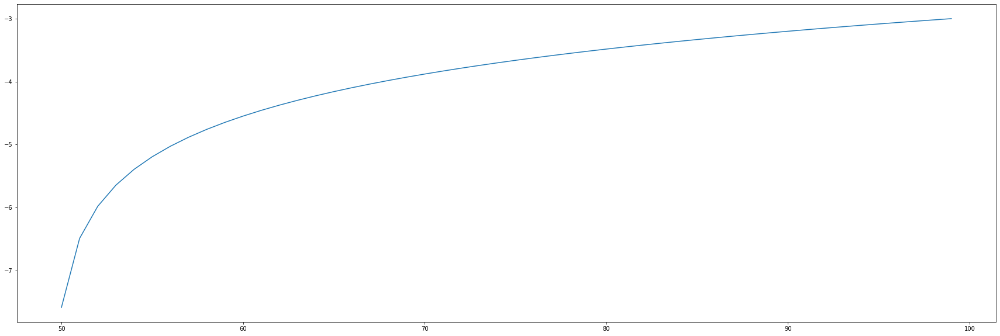

In [17]:
import matplotlib.pyplot as plt
plt.figure(figsize=(30,10))
x = np.linspace(-0.05,0.05,100)
plt.plot(np.log(x))
plt.show()

# Project 2: Creating the Input/Output Data<a id='project_2'></a>

**TODO:** Create a [set](https://docs.python.org/3/tutorial/datastructures.html#sets) named `vocab` that contains every word in the vocabulary.

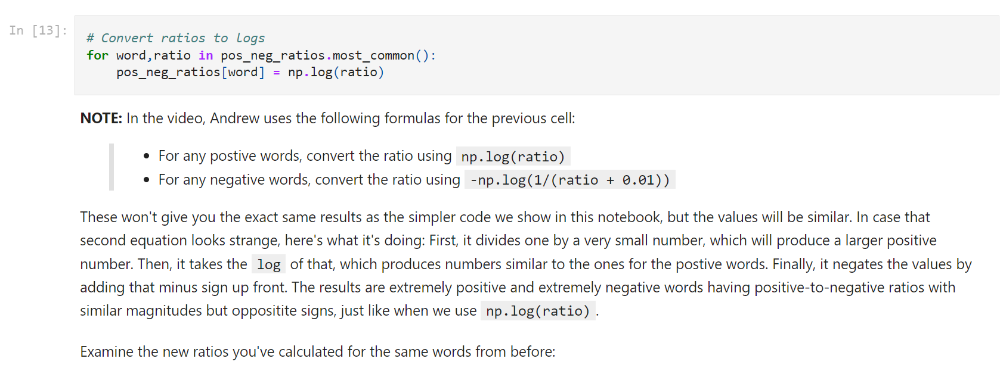

In [18]:
from IPython.display import Image
Image(filename = 'img.png')

In [19]:
vocab = set(total_counts.keys())

vocab

{'',
 'indirection',
 'apropos',
 'narratives',
 'nichols',
 'shalt',
 'eat',
 'unworthy',
 'poppins',
 'magistrate',
 'expedient',
 'revert',
 'mode',
 'antagonists',
 'stassard',
 'guntenberg',
 'reviewing',
 'gorged',
 'derail',
 'cinmea',
 'beeyotch',
 'pollen',
 'drss',
 'iberia',
 'guffman',
 'escaped',
 'kindler',
 'xxxxviii',
 'beefing',
 'capitalizes',
 'domini',
 'urf',
 'chihuahua',
 'confusinghalperin',
 'dredged',
 'erbe',
 'regimen',
 'deever',
 'kimono',
 'heider',
 'theatricality',
 'jiggs',
 'corey',
 'rei',
 'abandons',
 'soldiers',
 'surror',
 'goading',
 'laughingly',
 'honkytonks',
 'rackaroll',
 'termination',
 'twitty',
 'amick',
 'humility',
 'mounts',
 'dalton',
 'luved',
 'multiverse',
 'arrives',
 'glorifying',
 'brethern',
 'sylvester',
 'wellesian',
 'disses',
 'rustlings',
 'fantasic',
 'stuccoed',
 'unrurly',
 'faults',
 'margolin',
 'gaggle',
 'windscreen',
 'agreement',
 'wha',
 'godfrey',
 'arriba',
 'cartel',
 'ipod',
 'vocalize',
 'grew',
 'sodebergh

In [20]:
vocab_size = len(vocab)
print(vocab_size)

74074


In [21]:
list(vocab)[74073]

'maxwell'

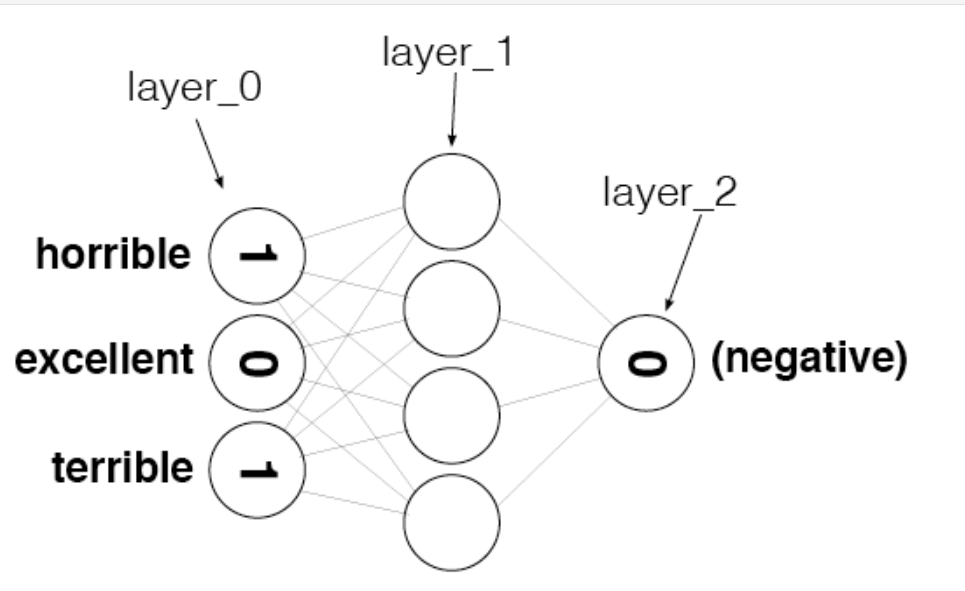

In [22]:
from IPython.display import Image
Image(filename = 'img_1.png')

In [23]:
layer_0 = np.zeros((1,vocab_size))

layer_0.shape

(1, 74074)

In [24]:
word2index = {}
for i, word in enumerate(vocab):
    word2index[word] = i

word2index

{'': 0,
 'indirection': 1,
 'apropos': 2,
 'narratives': 3,
 'nichols': 4,
 'shalt': 5,
 'eat': 6,
 'unworthy': 7,
 'poppins': 8,
 'magistrate': 9,
 'expedient': 10,
 'revert': 11,
 'mode': 12,
 'antagonists': 13,
 'stassard': 14,
 'guntenberg': 15,
 'reviewing': 16,
 'gorged': 17,
 'derail': 18,
 'cinmea': 19,
 'beeyotch': 20,
 'pollen': 21,
 'drss': 22,
 'iberia': 23,
 'guffman': 24,
 'escaped': 25,
 'kindler': 26,
 'xxxxviii': 27,
 'beefing': 28,
 'capitalizes': 29,
 'domini': 30,
 'urf': 31,
 'chihuahua': 32,
 'confusinghalperin': 33,
 'dredged': 34,
 'erbe': 35,
 'regimen': 36,
 'deever': 37,
 'kimono': 38,
 'heider': 39,
 'theatricality': 40,
 'jiggs': 41,
 'corey': 42,
 'rei': 43,
 'abandons': 44,
 'soldiers': 45,
 'surror': 46,
 'goading': 47,
 'laughingly': 48,
 'honkytonks': 49,
 'rackaroll': 50,
 'termination': 51,
 'twitty': 52,
 'amick': 53,
 'humility': 54,
 'mounts': 55,
 'dalton': 56,
 'luved': 57,
 'multiverse': 58,
 'arrives': 59,
 'glorifying': 60,
 'brethern': 61,
 

In [25]:
def update_input_layer(review):
    """ Modify the global layer_0 to represent the vector form of review.
    The element at a given index of layer_0 should represent \
    how many times the given word occurs in the review.
    Args:
        review(string) - the string of the review
    Returns:
        None
    """
    global layer_0
    # clear out previous state, reset the layer to be all 0s
    layer_0 *= 0

    for word in review.split(" "):
        layer_0[0][word2index[word]] += 1

    pass

In [26]:
for i in reviews[1].split(" "):
    print(i)

story
of
a
man
who
has
unnatural
feelings
for
a
pig
.
starts
out
with
a
opening
scene
that
is
a
terrific
example
of
absurd
comedy
.
a
formal
orchestra
audience
is
turned
into
an
insane

violent
mob
by
the
crazy
chantings
of
it

s
singers
.
unfortunately
it
stays
absurd
the
whole
time
with
no
general
narrative
eventually
making
it
just
too
off
putting
.
even
those
from
the
era
should
be
turned
off
.
the
cryptic
dialogue
would
make
shakespeare
seem
easy
to
a
third
grader
.
on
a
technical
level
it

s
better
than
you
might
think
with
some
good
cinematography
by
future
great
vilmos
zsigmond
.
future
stars
sally
kirkland
and
frederic
forrest
can
be
seen
briefly
.




In [27]:
update_input_layer(reviews[1])

layer_0

array([[5., 0., 0., ..., 0., 0., 0.]])

In [28]:
reviews[1].split(" ") ==  reviews[1].split()

False

In [29]:
def get_target_for_label(label):
    """Convert a label to `0` or `1`.
    Args:
        label(string) - Either "POSITIVE" or "NEGATIVE".
    Returns:
        `0` or `1`.
    """
    if label == 'POSITIVE':
        return 1
    else:
        return 0

In [30]:
labels[0]

'POSITIVE'

In [31]:
get_target_for_label(labels[0])

1

In [34]:
labels

['POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',
 'NEGATIVE',
 'POSITIVE',

In [86]:
import time
import sys
import numpy as np

class SentimentNetwork:
    def __init__(self, reviews, labels, hidden_nodes = 10, learning_rate = 0.1):
        """Create a SentimenNetwork with the given settings
        Args:
            reviews(list) - List of reviews used for training
            labels(list) - List of POSITIVE/NEGATIVE labels associated with the given reviews
            hidden_nodes(int) - Number of nodes to create in the hidden layer
            learning_rate(float) - Learning rate to use while training

        """
        # Assign a seed to our random number generator to ensure we get
        # reproducible results during development
        np.random.seed(1)

        # process the reviews and their associated labels so that everything
        # is ready for training
        self.pre_process_data(reviews, labels)

        # Build the network to have the number of hidden nodes and the learning rate that
        # were passed into this initializer. Make the same number of input nodes as
        # there are vocabulary words and create a single output node.
        self.init_network(len(self.review_vocab),hidden_nodes, 1, learning_rate)

    def pre_process_data(self, reviews, labels):

        review_vocab = set()

        # TODO: populate review_vocab with all of the words in the given reviews
        #       Remember to split reviews into individual words
        #       using "split(' ')" instead of "split()".

        for review in reviews:
            for word in review.split(' '):
                review_vocab.add(word)

        # Convert the vocabulary set to a list so we can access words via indices
        self.review_vocab = list(review_vocab)

        label_vocab = set()

        # TODO: populate label_vocab with all of the words in the given labels.
        #       There is no need to split the labels because each one is a single word.

        for label in labels:
            label_vocab.add(label)

        # Convert the label vocabulary set to a list so we can access labels via indices
        self.label_vocab = list(label_vocab)

        # Store the sizes of the review and label vocabularies.
        self.review_vocab_size = len(self.review_vocab)
        self.label_vocab_size = len(self.label_vocab)

        # Create a dictionary of words in the vocabulary mapped to index positions
        self.word2index = {}

        # TODO: populate self.word2index with indices for all the words in self.review_vocab
        #       like you saw earlier in the notebook
        for i, word in enumerate(self.review_vocab):
            self.word2index[word] = i

        # Create a dictionary of labels mapped to index positions
        self.label2index = {}

        # TODO: do the same thing you did for self.word2index and self.review_vocab,
        #       but for self.label2index and self.label_vocab instead

        for i, word in enumerate(self.label_vocab):
            self.label2index[word] = i

    def init_network(self,input_nodes,hidden_nodes,output_nodes,learning_rate):
        # Store the number of nodes in input, hidden, and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Store the learning rate
        self.learning_rate = learning_rate

        # Initialize weights

        # TODO: initialize self.weights_0_1 as a matrix of zeros. These are the weights between
        #       the input layer and the hidden layer.

        self.weights_0_1 = np.zeros((self.input_nodes,self.hidden_nodes))

        # TODO: initialize self.weights_1_2 as a matrix of random values.
        #       These are the weights between the hidden layer and the output layer.
        self.weights_1_2 = np.random.randn(self.hidden_nodes,self.output_nodes)

        # TODO: Create the input layer, a two-dimensional matrix with shape
        #       1 x input_nodes, with all values initialized to zero
        self.layer_0 = np.zeros((1,input_nodes))

    def update_input_layer(self,review):

        # clear out the previous state, reset the layer to be all 0s
        self.layer_0 *= 0

        for word in review.split(" "):
            # NOTE: This if-check was not in the version of this method created in Project 2,
            #       and it appears in Andrew's Project 3 solution without explanation.
            #       It simply ensures the word is actually a key in word2index before
            #       accessing it, which is important because accessing an invalid key
            #       with raise an exception in Python. This allows us to ignore unknown
            #       words encountered in new reviews.
            if(word in self.word2index.keys()):
                self.layer_0[0][self.word2index[word]] += 1

    def get_target_for_label(self,label):

        if(label == 'POSITIVE'):
            return 1
        else:
            return 0

    def sigmoid(self,x):
        return 1 / (1 + np.exp(-x))

    def sigmoid_output_2_derivative(self,output):
        return output * (1-output)

    def train(self, training_reviews, training_labels):

        # make sure out we have a matching number of reviews and labels
        assert(len(training_reviews) == len(training_labels))

        # Keep track of correct predictions to display accuracy during training
        correct_so_far = 0

        # Remember when we started for printing time statistics
        start = time.time()

        # loop through all the given reviews and run a forward and backward pass,
        # updating weights for every item

        for i in range(len(training_reviews)):

            # TODO: Get the next review and its correct label

            review = training_reviews[i]
            label = training_labels[i]

            # TODO: Implement the forward pass through the network.
            #       That means use the given review to update the input layer,
            #       then calculate values for the hidden layer,
            #       and finally calculate the output layer.
            #
            #       Do not use an activation function for the hidden layer,
            #       but use the sigmoid activation function for the output layer.

            # Input layer
            self.update_input_layer(review)

            # Hidden layer
            layer_1 = np.dot(self.layer_0, self.weights_0_1)

            # Ouput layer
            layer_2 = self.sigmoid(np.dot(layer_1,self.weights_1_2))

            # TODO: Implement the back propagation pass here.
            #       That means calculate the error for the forward pass's prediction
            #       and update the weights in the network according to their
            #       contributions toward the error, as calculated via the
            #       gradient descent and back propagation algorithms you
            #       learned in class.

            # Output error
            layer_2_error = layer_2 - self.get_target_for_label(label) # Output layer error is the difference
            layer_2_delta = layer_2_error * self.sigmoid_output_2_derivative(layer_2)

            # Backpropagated error
            layer_1_error = np.dot(layer_2_delta,self.weights_1_2.T) # errors propagated in the hidden layer_0
            layer_1_delta = layer_1_error # hidden layer gradients - no nonlinearity so it's the same

            # Update the weights
            self.weights_1_2 -= layer_1.T.dot(layer_2_delta) * self.learning_rate # update hidden-to-output weights with gradient descent step
            self.weights_0_1 -= self.layer_0.T.dot(layer_1_delta) * self.learning_rate # update input-to-hidden weights

            # TODO: Keep track of correct predictions. To determine if the prediction was
            #       correct, check that the absolute value of the output error
            #       is less than 0.5. If so, add one to the correct_so_far count.

            if layer_2 > 0.5 and label == 'POSITIVE':
                correct_so_far += 1
            if layer_2 < 0.5 and label =='NEGATIVE':
                correct_so_far += 1

            # For debug purposes, print out our prediction accuracy and speed
            # throughout the training process.

            elapsed_time = float(time.time() - start)
            reviews_per_second = i/elapsed_time if elapsed_time > 0 else 0

            sys.stdout.write("\nProgress:" + str(100 * i/float(len(training_reviews)))[:4] \
                             + '%Speed(reviews.sec):' + str(reviews_per_second)[0:5] \
                             + '#Correct:' + str(correct_so_far) + '#Trained:' + str(i+1) \
                             + 'Training Accyracy:' + str(correct_so_far * 100 / float(i+1))[:4]+ '%')
            if i%2500 == 0:

                print("")

    def test(self,testing_reviews,testing_labels):

        """
        Attempts to predict the labels for the given testing_reviews,
        and uses the test_labels to calculate the accuracy of those predictions.
        """

        # keep track of how many correct predictions we make
        correct = 0

        start = time.time()

        # loop through each of the review and call run to predict the label

        for i in range(len(testing_reviews)):
            pred = self.run(testing_reviews[i])
            if pred == testing_labels[i]:
                correct += 1

            # For debug purposes, print out our prediction accuracy and speed
            # throughout the prediction process.

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0

            sys.stdout.write("\rProgress:" + str(100 * i/float(len(testing_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct) + " #Tested:" + str(i+1) \
                             + " Testing Accuracy:" + str(correct * 100 / float(i+1))[:4] + "%")
    def run(self, review):
        """
        Returns a POSITIVE or NEGATIVE prediction for the given review.
        """
        # TODO: Run a forward pass through the network, like you did in the
        #       "train" function. That means use the given review to
        #       update the input layer, then calculate values for the hidden layer,
        #       and finally calculate the output layer.
        #
        #       Note: The review passed into this function for prediction
        #             might come from anywhere, so you should convert it
        #             to lower case prior to using it.

        review = review.lower()

        # Input layer
        self.update_input_layer(review)

        # Hidden layer
        layer_1 = np.dot(self.layer_0, self.weights_0_1)

        # Ouput layer
        layer_2 = self.sigmoid(np.dot(layer_1,self.weights_1_2))

        # TODO: The output layer should now contain a prediction.
        #       Return `POSITIVE` for predictions greater-than-or-equal-to `0.5`,
        #       and `NEGATIVE` otherwise.

        # Return POSITIVE for values above greater-than-or-equal-to 0.5 in the output layer;
        # return NEGATIVE for other values
        if layer_2[0] >= 0.5:
            return "POSITIVE"
        else:
            return "NEGATIVE"


In [44]:
np.random.normal(0.0,4**-0.5,(3,4))

array([[-0.81489091, -0.15542059,  0.57842492,  0.12546369],
       [ 0.55627029, -0.18032225, -0.26982108,  0.36142748],
       [-0.16399549,  0.08071342,  0.26236005, -0.29594055]])

In [45]:
assert(3==3)

In [79]:
# Run the following cell to create a SentimentNetwork that will train on all but the last 1000 reviews (we're saving those for testing). Here we use a learning rate of 0.1.

mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.1)

In [60]:
# Run the following cell to test the network's performance against the last 1000 reviews (the ones we held out from our training set).

# We have not trained the model yet, so the results should be about 50% as it will just be guessing and there are only two possible values to choose from.

mlp.test(reviews[-1000:],labels[-1000:])

Progress:99.9% Speed(reviews/sec):1819. #Correct:500 #Tested:1000 Testing Accuracy:50.0%

In [80]:
# Run the following cell to actually train the network. During training, it will display the model's accuracy repeatedly as it trains so you can see how well it's doing.

mlp.train(reviews[:-1000],labels[:-1000])


Progress:0.0%Speed(reviews.sec):0.0#Correct:0#Trained:1Training Accyracy:0.0%

Progress:0.00%Speed(reviews.sec):83.23#Correct:0#Trained:2Training Accyracy:0.0%
Progress:0.00%Speed(reviews.sec):105.2#Correct:1#Trained:3Training Accyracy:33.3%
Progress:0.01%Speed(reviews.sec):115.3#Correct:1#Trained:4Training Accyracy:25.0%
Progress:0.01%Speed(reviews.sec):128.9#Correct:2#Trained:5Training Accyracy:40.0%
Progress:0.02%Speed(reviews.sec):135.0#Correct:2#Trained:6Training Accyracy:33.3%
Progress:0.02%Speed(reviews.sec):139.4#Correct:3#Trained:7Training Accyracy:42.8%
Progress:0.02%Speed(reviews.sec):145.7#Correct:3#Trained:8Training Accyracy:37.5%
Progress:0.03%Speed(reviews.sec):150.9#Correct:4#Trained:9Training Accyracy:44.4%
Progress:0.03%Speed(reviews.sec):152.5#Correct:4#Trained:10Training Accyracy:40.0%
Progress:0.04%Speed(reviews.sec):153.8#Correct:5#Trained:11Training Accyracy:45.4%
Progress:0.04%Speed(reviews.sec):154.9#Correct:5#Trained:12Training Accyracy:41.6%
Progress:0.05%Sp

In [81]:
# That most likely didn't train very well. Part of the reason may be because the learning rate is too high. Run the following cell to recreate the network with a smaller learning rate, 0.01, and then train the new network.

mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.01)
mlp.train(reviews[:-1000],labels[:-1000])


Progress:0.0%Speed(reviews.sec):0.0#Correct:0#Trained:1Training Accyracy:0.0%

Progress:0.00%Speed(reviews.sec):62.48#Correct:0#Trained:2Training Accyracy:0.0%
Progress:0.00%Speed(reviews.sec):90.86#Correct:1#Trained:3Training Accyracy:33.3%
Progress:0.01%Speed(reviews.sec):103.4#Correct:1#Trained:4Training Accyracy:25.0%
Progress:0.01%Speed(reviews.sec):114.2#Correct:2#Trained:5Training Accyracy:40.0%
Progress:0.02%Speed(reviews.sec):124.9#Correct:2#Trained:6Training Accyracy:33.3%
Progress:0.02%Speed(reviews.sec):127.6#Correct:3#Trained:7Training Accyracy:42.8%
Progress:0.02%Speed(reviews.sec):134.5#Correct:3#Trained:8Training Accyracy:37.5%
Progress:0.03%Speed(reviews.sec):137.8#Correct:4#Trained:9Training Accyracy:44.4%
Progress:0.03%Speed(reviews.sec):138.4#Correct:4#Trained:10Training Accyracy:40.0%
Progress:0.04%Speed(reviews.sec):140.8#Correct:5#Trained:11Training Accyracy:45.4%
Progress:0.04%Speed(reviews.sec):142.8#Correct:5#Trained:12Training Accyracy:41.6%
Progress:0.05%Sp

C:\Users\Andrei\AppData\Local\Temp\ipykernel_20292\4159717613.py:122: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-x))



Progress:96.5%Speed(reviews.sec):186.6#Correct:11583#Trained:23177Training Accyracy:49.9%
Progress:96.5%Speed(reviews.sec):186.6#Correct:11584#Trained:23178Training Accyracy:49.9%
Progress:96.5%Speed(reviews.sec):186.6#Correct:11584#Trained:23179Training Accyracy:49.9%
Progress:96.5%Speed(reviews.sec):186.6#Correct:11585#Trained:23180Training Accyracy:49.9%
Progress:96.5%Speed(reviews.sec):186.6#Correct:11585#Trained:23181Training Accyracy:49.9%
Progress:96.5%Speed(reviews.sec):186.6#Correct:11586#Trained:23182Training Accyracy:49.9%
Progress:96.5%Speed(reviews.sec):186.6#Correct:11586#Trained:23183Training Accyracy:49.9%
Progress:96.5%Speed(reviews.sec):186.6#Correct:11587#Trained:23184Training Accyracy:49.9%
Progress:96.6%Speed(reviews.sec):186.6#Correct:11587#Trained:23185Training Accyracy:49.9%
Progress:96.6%Speed(reviews.sec):186.6#Correct:11588#Trained:23186Training Accyracy:49.9%
Progress:96.6%Speed(reviews.sec):186.6#Correct:11588#Trained:23187Training Accyracy:49.9%
Progress:

In [84]:
# That probably wasn't much different. Run the following cell to recreate the network one more time with an even smaller learning rate, 0.001, and then train the new network.

mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.001)
mlp.train(reviews[:-1000],labels[:-1000])


Progress:0.0%Speed(reviews.sec):0.0#Correct:0#Trained:1Training Accyracy:0.0%

Progress:0.00%Speed(reviews.sec):32.25#Correct:0#Trained:2Training Accyracy:0.0%
Progress:0.00%Speed(reviews.sec):47.60#Correct:1#Trained:3Training Accyracy:33.3%
Progress:0.01%Speed(reviews.sec):55.54#Correct:1#Trained:4Training Accyracy:25.0%
Progress:0.01%Speed(reviews.sec):59.68#Correct:2#Trained:5Training Accyracy:40.0%
Progress:0.02%Speed(reviews.sec):64.92#Correct:3#Trained:6Training Accyracy:50.0%
Progress:0.02%Speed(reviews.sec):67.39#Correct:4#Trained:7Training Accyracy:57.1%
Progress:0.02%Speed(reviews.sec):71.32#Correct:4#Trained:8Training Accyracy:50.0%
Progress:0.03%Speed(reviews.sec):76.82#Correct:5#Trained:9Training Accyracy:55.5%
Progress:0.03%Speed(reviews.sec):80.78#Correct:5#Trained:10Training Accyracy:50.0%
Progress:0.04%Speed(reviews.sec):85.17#Correct:6#Trained:11Training Accyracy:54.5%
Progress:0.04%Speed(reviews.sec):88.89#Correct:6#Trained:12Training Accyracy:50.0%
Progress:0.05%Sp

In [88]:
layer_0

array([[5., 0., 0., ..., 0., 0., 0.]])

In [89]:
review_counter = Counter()

In [91]:
for word in reviews[0].split(" "):
    review_counter[word] += 1

In [92]:
review_counter.most_common()

[('.', 27),
 ('', 18),
 ('the', 9),
 ('to', 6),
 ('high', 5),
 ('i', 5),
 ('bromwell', 4),
 ('is', 4),
 ('a', 4),
 ('teachers', 4),
 ('that', 4),
 ('of', 4),
 ('it', 2),
 ('at', 2),
 ('as', 2),
 ('school', 2),
 ('my', 2),
 ('in', 2),
 ('me', 2),
 ('students', 2),
 ('their', 2),
 ('student', 2),
 ('cartoon', 1),
 ('comedy', 1),
 ('ran', 1),
 ('same', 1),
 ('time', 1),
 ('some', 1),
 ('other', 1),
 ('programs', 1),
 ('about', 1),
 ('life', 1),
 ('such', 1),
 ('years', 1),
 ('teaching', 1),
 ('profession', 1),
 ('lead', 1),
 ('believe', 1),
 ('s', 1),
 ('satire', 1),
 ('much', 1),
 ('closer', 1),
 ('reality', 1),
 ('than', 1),
 ('scramble', 1),
 ('survive', 1),
 ('financially', 1),
 ('insightful', 1),
 ('who', 1),
 ('can', 1),
 ('see', 1),
 ('right', 1),
 ('through', 1),
 ('pathetic', 1),
 ('pomp', 1),
 ('pettiness', 1),
 ('whole', 1),
 ('situation', 1),
 ('all', 1),
 ('remind', 1),
 ('schools', 1),
 ('knew', 1),
 ('and', 1),
 ('when', 1),
 ('saw', 1),
 ('episode', 1),
 ('which', 1),
 ('r

TODO: Attempt to reduce the noise in the input data like Andrew did in the previous video. Specifically, do the following:

Copy the SentimentNetwork class you created earlier into the following cell.
Modify update_input_layer so it does not count how many times each word is used, but rather just stores whether or not a word was used.
The following code is the same as the previous project, with project-specific changes marked with "New for Project 4"

In [94]:
import time
import sys
import numpy as np

class SentimentNetwork:
    def __init__(self, reviews, labels, hidden_nodes = 10, learning_rate = 0.1):
        """Create a SentimenNetwork with the given settings
        Args:
            reviews(list) - List of reviews used for training
            labels(list) - List of POSITIVE/NEGATIVE labels associated with the given reviews
            hidden_nodes(int) - Number of nodes to create in the hidden layer
            learning_rate(float) - Learning rate to use while training

        """
        # Assign a seed to our random number generator to ensure we get
        # reproducible results during development
        np.random.seed(1)

        # process the reviews and their associated labels so that everything
        # is ready for training
        self.pre_process_data(reviews, labels)

        # Build the network to have the number of hidden nodes and the learning rate that
        # were passed into this initializer. Make the same number of input nodes as
        # there are vocabulary words and create a single output node.
        self.init_network(len(self.review_vocab),hidden_nodes, 1, learning_rate)

    def pre_process_data(self, reviews, labels):

        review_vocab = set()

        # TODO: populate review_vocab with all of the words in the given reviews
        #       Remember to split reviews into individual words
        #       using "split(' ')" instead of "split()".

        for review in reviews:
            for word in review.split(' '):
                review_vocab.add(word)

        # Convert the vocabulary set to a list so we can access words via indices
        self.review_vocab = list(review_vocab)

        label_vocab = set()

        # TODO: populate label_vocab with all of the words in the given labels.
        #       There is no need to split the labels because each one is a single word.

        for label in labels:
            label_vocab.add(label)

        # Convert the label vocabulary set to a list so we can access labels via indices
        self.label_vocab = list(label_vocab)

        # Store the sizes of the review and label vocabularies.
        self.review_vocab_size = len(self.review_vocab)
        self.label_vocab_size = len(self.label_vocab)

        # Create a dictionary of words in the vocabulary mapped to index positions
        self.word2index = {}

        # TODO: populate self.word2index with indices for all the words in self.review_vocab
        #       like you saw earlier in the notebook
        for i, word in enumerate(self.review_vocab):
            self.word2index[word] = i

        # Create a dictionary of labels mapped to index positions
        self.label2index = {}

        # TODO: do the same thing you did for self.word2index and self.review_vocab,
        #       but for self.label2index and self.label_vocab instead

        for i, word in enumerate(self.label_vocab):
            self.label2index[word] = i

    def init_network(self,input_nodes,hidden_nodes,output_nodes,learning_rate):
        # Store the number of nodes in input, hidden, and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Store the learning rate
        self.learning_rate = learning_rate

        # Initialize weights

        # TODO: initialize self.weights_0_1 as a matrix of zeros. These are the weights between
        #       the input layer and the hidden layer.

        self.weights_0_1 = np.zeros((self.input_nodes,self.hidden_nodes))

        # TODO: initialize self.weights_1_2 as a matrix of random values.
        #       These are the weights between the hidden layer and the output layer.
        self.weights_1_2 = np.random.randn(self.hidden_nodes,self.output_nodes)

        # TODO: Create the input layer, a two-dimensional matrix with shape
        #       1 x input_nodes, with all values initialized to zero
        self.layer_0 = np.zeros((1,input_nodes))

    def update_input_layer(self,review):

        # clear out the previous state, reset the layer to be all 0s
        self.layer_0 *= 0

        for word in review.split(" "):
            # NOTE: This if-check was not in the version of this method created in Project 2,
            #       and it appears in Andrew's Project 3 solution without explanation.
            #       It simply ensures the word is actually a key in word2index before
            #       accessing it, which is important because accessing an invalid key
            #       with raise an exception in Python. This allows us to ignore unknown
            #       words encountered in new reviews.
            if(word in self.word2index.keys()):
                self.layer_0[0][self.word2index[word]] = 1

    def get_target_for_label(self,label):

        if(label == 'POSITIVE'):
            return 1
        else:
            return 0

    def sigmoid(self,x):
        return 1 / (1 + np.exp(-x))

    def sigmoid_output_2_derivative(self,output):
        return output * (1-output)

    def train(self, training_reviews, training_labels):

        # make sure out we have a matching number of reviews and labels
        assert(len(training_reviews) == len(training_labels))

        # Keep track of correct predictions to display accuracy during training
        correct_so_far = 0

        # Remember when we started for printing time statistics
        start = time.time()

        # loop through all the given reviews and run a forward and backward pass,
        # updating weights for every item

        for i in range(len(training_reviews)):

            # TODO: Get the next review and its correct label

            review = training_reviews[i]
            label = training_labels[i]

            # TODO: Implement the forward pass through the network.
            #       That means use the given review to update the input layer,
            #       then calculate values for the hidden layer,
            #       and finally calculate the output layer.
            #
            #       Do not use an activation function for the hidden layer,
            #       but use the sigmoid activation function for the output layer.

            # Input layer
            self.update_input_layer(review)

            # Hidden layer
            layer_1 = np.dot(self.layer_0, self.weights_0_1)

            # Ouput layer
            layer_2 = self.sigmoid(np.dot(layer_1,self.weights_1_2))

            # TODO: Implement the back propagation pass here.
            #       That means calculate the error for the forward pass's prediction
            #       and update the weights in the network according to their
            #       contributions toward the error, as calculated via the
            #       gradient descent and back propagation algorithms you
            #       learned in class.

            # Output error
            layer_2_error = layer_2 - self.get_target_for_label(label) # Output layer error is the difference
            layer_2_delta = layer_2_error * self.sigmoid_output_2_derivative(layer_2)

            # Backpropagated error
            layer_1_error = np.dot(layer_2_delta,self.weights_1_2.T) # errors propagated in the hidden layer_0
            layer_1_delta = layer_1_error # hidden layer gradients - no nonlinearity so it's the same

            # Update the weights
            self.weights_1_2 -= layer_1.T.dot(layer_2_delta) * self.learning_rate # update hidden-to-output weights with gradient descent step
            self.weights_0_1 -= self.layer_0.T.dot(layer_1_delta) * self.learning_rate # update input-to-hidden weights

            # TODO: Keep track of correct predictions. To determine if the prediction was
            #       correct, check that the absolute value of the output error
            #       is less than 0.5. If so, add one to the correct_so_far count.

            if layer_2 > 0.5 and label == 'POSITIVE':
                correct_so_far += 1
            if layer_2 < 0.5 and label =='NEGATIVE':
                correct_so_far += 1

            # For debug purposes, print out our prediction accuracy and speed
            # throughout the training process.

            elapsed_time = float(time.time() - start)
            reviews_per_second = i/elapsed_time if elapsed_time > 0 else 0

            sys.stdout.write("\nProgress:" + str(100 * i/float(len(training_reviews)))[:4] \
                             + '%Speed(reviews.sec):' + str(reviews_per_second)[0:5] \
                             + '#Correct:' + str(correct_so_far) + '#Trained:' + str(i+1) \
                             + 'Training Accyracy:' + str(correct_so_far * 100 / float(i+1))[:4]+ '%')
            if i%2500 == 0:

                print("")

    def test(self,testing_reviews,testing_labels):

        """
        Attempts to predict the labels for the given testing_reviews,
        and uses the test_labels to calculate the accuracy of those predictions.
        """

        # keep track of how many correct predictions we make
        correct = 0

        start = time.time()

        # loop through each of the review and call run to predict the label

        for i in range(len(testing_reviews)):
            pred = self.run(testing_reviews[i])
            if pred == testing_labels[i]:
                correct += 1

            # For debug purposes, print out our prediction accuracy and speed
            # throughout the prediction process.

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0

            sys.stdout.write("\rProgress:" + str(100 * i/float(len(testing_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct) + " #Tested:" + str(i+1) \
                             + " Testing Accuracy:" + str(correct * 100 / float(i+1))[:4] + "%")
    def run(self, review):
        """
        Returns a POSITIVE or NEGATIVE prediction for the given review.
        """
        # TODO: Run a forward pass through the network, like you did in the
        #       "train" function. That means use the given review to
        #       update the input layer, then calculate values for the hidden layer,
        #       and finally calculate the output layer.
        #
        #       Note: The review passed into this function for prediction
        #             might come from anywhere, so you should convert it
        #             to lower case prior to using it.

        review = review.lower()

        # Input layer
        self.update_input_layer(review)

        # Hidden layer
        layer_1 = np.dot(self.layer_0, self.weights_0_1)

        # Ouput layer
        layer_2 = self.sigmoid(np.dot(layer_1,self.weights_1_2))

        # TODO: The output layer should now contain a prediction.
        #       Return `POSITIVE` for predictions greater-than-or-equal-to `0.5`,
        #       and `NEGATIVE` otherwise.

        # Return POSITIVE for values above greater-than-or-equal-to 0.5 in the output layer;
        # return NEGATIVE for other values
        if layer_2[0] >= 0.5:
            return "POSITIVE"
        else:
            return "NEGATIVE"


In [95]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.1)
mlp.train(reviews[:-1000],labels[:-1000])


Progress:0.0%Speed(reviews.sec):0.0#Correct:0#Trained:1Training Accyracy:0.0%

Progress:0.00%Speed(reviews.sec):90.93#Correct:0#Trained:2Training Accyracy:0.0%
Progress:0.00%Speed(reviews.sec):113.8#Correct:1#Trained:3Training Accyracy:33.3%
Progress:0.01%Speed(reviews.sec):122.1#Correct:1#Trained:4Training Accyracy:25.0%
Progress:0.01%Speed(reviews.sec):135.3#Correct:2#Trained:5Training Accyracy:40.0%
Progress:0.02%Speed(reviews.sec):144.6#Correct:2#Trained:6Training Accyracy:33.3%
Progress:0.02%Speed(reviews.sec):151.6#Correct:2#Trained:7Training Accyracy:28.5%
Progress:0.02%Speed(reviews.sec):150.3#Correct:2#Trained:8Training Accyracy:25.0%
Progress:0.03%Speed(reviews.sec):149.3#Correct:3#Trained:9Training Accyracy:33.3%
Progress:0.03%Speed(reviews.sec):148.6#Correct:3#Trained:10Training Accyracy:30.0%
Progress:0.04%Speed(reviews.sec):148.0#Correct:4#Trained:11Training Accyracy:36.3%
Progress:0.04%Speed(reviews.sec):151.5#Correct:4#Trained:12Training Accyracy:33.3%
Progress:0.05%Sp

In [96]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:99.9% Speed(reviews/sec):1906. #Correct:844 #Tested:1000 Testing Accuracy:84.4%

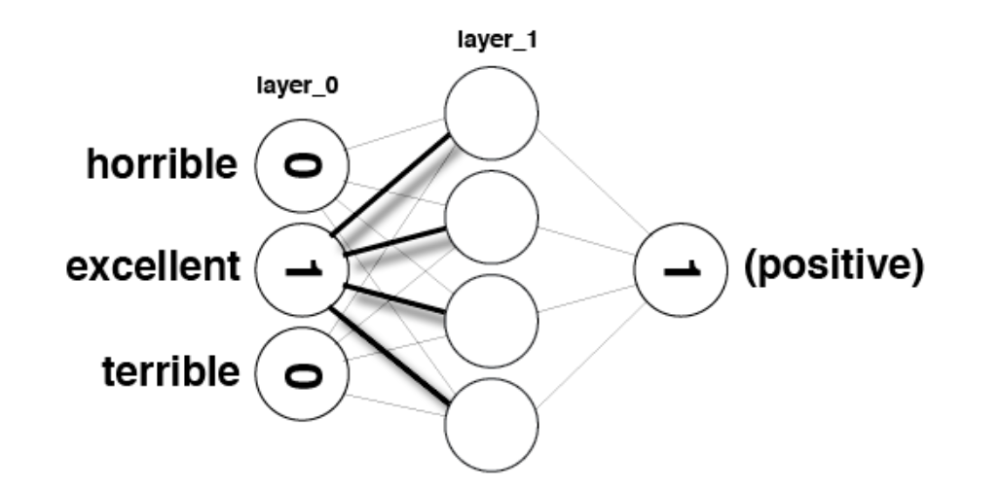

In [99]:
Image(filename='img_2.png')

In [100]:
layer_0 = np.zeros(10)

In [101]:
layer_0

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [102]:
layer_0[4] = 1
layer_0[9] = 1

In [103]:
layer_0.T

array([0., 0., 0., 0., 1., 0., 0., 0., 0., 1.])

In [104]:
weights_0_1 = np.random.randn(10,5)

In [105]:
layer_0.dot(weights_0_1)

array([-0.10503756,  0.44222989,  0.24392938, -0.55961832,  0.21389503])

In [209]:
weights_0_1

array([[ 1.46210794, -2.06014071, -0.3224172 , -0.38405435,  1.13376944],
       [-1.09989127, -0.17242821, -0.87785842,  0.04221375,  0.58281521],
       [-1.10061918,  1.14472371,  0.90159072,  0.50249434,  0.90085595],
       [-0.68372786, -0.12289023, -0.93576943, -0.26788808,  0.53035547],
       [-0.69166075, -0.39675353, -0.6871727 , -0.84520564, -0.67124613],
       [-0.0126646 , -1.11731035,  0.2344157 ,  1.65980218,  0.74204416],
       [-0.19183555, -0.88762896, -0.74715829,  1.6924546 ,  0.05080775],
       [-0.63699565,  0.19091548,  2.10025514,  0.12015895,  0.61720311],
       [ 0.30017032, -0.35224985, -1.1425182 , -0.34934272, -0.20889423],
       [ 0.58662319,  0.83898341,  0.93110208,  0.28558733,  0.88514116]])

In [210]:
weights_0_1[4]

array([-0.69166075, -0.39675353, -0.6871727 , -0.84520564, -0.67124613])

In [106]:
indices = [4,9]

In [115]:
layer_1 = np.zeros(5)

In [116]:
for index in indices:
    layer_1 += (weights_0_1[index])

In [117]:
layer_1

array([-0.10503756,  0.44222989,  0.24392938, -0.55961832,  0.21389503])

In [128]:
list(word2index)[1]

'indirection'

In [137]:
word2index

{'': 0,
 'indirection': 1,
 'apropos': 2,
 'narratives': 3,
 'nichols': 4,
 'shalt': 5,
 'eat': 6,
 'unworthy': 7,
 'poppins': 8,
 'magistrate': 9,
 'expedient': 10,
 'revert': 11,
 'mode': 12,
 'antagonists': 13,
 'stassard': 14,
 'guntenberg': 15,
 'reviewing': 16,
 'gorged': 17,
 'derail': 18,
 'cinmea': 19,
 'beeyotch': 20,
 'pollen': 21,
 'drss': 22,
 'iberia': 23,
 'guffman': 24,
 'escaped': 25,
 'kindler': 26,
 'xxxxviii': 27,
 'beefing': 28,
 'capitalizes': 29,
 'domini': 30,
 'urf': 31,
 'chihuahua': 32,
 'confusinghalperin': 33,
 'dredged': 34,
 'erbe': 35,
 'regimen': 36,
 'deever': 37,
 'kimono': 38,
 'heider': 39,
 'theatricality': 40,
 'jiggs': 41,
 'corey': 42,
 'rei': 43,
 'abandons': 44,
 'soldiers': 45,
 'surror': 46,
 'goading': 47,
 'laughingly': 48,
 'honkytonks': 49,
 'rackaroll': 50,
 'termination': 51,
 'twitty': 52,
 'amick': 53,
 'humility': 54,
 'mounts': 55,
 'dalton': 56,
 'luved': 57,
 'multiverse': 58,
 'arrives': 59,
 'glorifying': 60,
 'brethern': 61,
 

In [198]:
training_rev_dummy = []


review_dummy = reviews[0]
label_dummy = labels[0]
indices = set()
for word in review_dummy.split(" "):

    if word in word2index.keys():
        # training_rev_dummy.append(word2index[word])
        indices.add(word2index[word])
training_rev_dummy.append(list(indices))

In [199]:
training_rev_dummy

[[0,
  10254,
  13331,
  21015,
  57879,
  29721,
  1048,
  71197,
  33310,
  6174,
  36897,
  71722,
  61493,
  2616,
  54844,
  68092,
  56387,
  29764,
  6727,
  20040,
  73801,
  41552,
  41046,
  15459,
  1642,
  65643,
  70250,
  13426,
  49781,
  60023,
  70777,
  28294,
  49296,
  63144,
  21684,
  24253,
  71361,
  62153,
  19146,
  54475,
  3791,
  1236,
  14548,
  17631,
  71391,
  43749,
  12018,
  61173,
  42747,
  71434,
  69904,
  56605,
  23327,
  61221,
  42797,
  65328,
  44348,
  64325,
  57670,
  14665,
  45910,
  11612,
  72545,
  29541,
  73087,
  58253,
  61326,
  56720,
  33682,
  26522,
  58267,
  34717,
  65438,
  55201,
  41904,
  55217,
  60341,
  53174,
  35254,
  15804,
  26051,
  968,
  72654,
  43473,
  15844,
  44517,
  1512,
  40434,
  14323,
  54771,
  26103,
  60924,
  46589]]

In [201]:
len(training_rev_dummy[0])

93

In [179]:
training_reviews = []

for review in reviews[:4]:
    indices = set()
    for word in review.split(" "):
        print(word)
        break

bromwell
story
homelessness
airport


In [182]:
word2index.keys()

dict_keys(['', 'indirection', 'apropos', 'narratives', 'nichols', 'shalt', 'eat', 'unworthy', 'poppins', 'magistrate', 'expedient', 'revert', 'mode', 'antagonists', 'stassard', 'guntenberg', 'reviewing', 'gorged', 'derail', 'cinmea', 'beeyotch', 'pollen', 'drss', 'iberia', 'guffman', 'escaped', 'kindler', 'xxxxviii', 'beefing', 'capitalizes', 'domini', 'urf', 'chihuahua', 'confusinghalperin', 'dredged', 'erbe', 'regimen', 'deever', 'kimono', 'heider', 'theatricality', 'jiggs', 'corey', 'rei', 'abandons', 'soldiers', 'surror', 'goading', 'laughingly', 'honkytonks', 'rackaroll', 'termination', 'twitty', 'amick', 'humility', 'mounts', 'dalton', 'luved', 'multiverse', 'arrives', 'glorifying', 'brethern', 'sylvester', 'wellesian', 'disses', 'rustlings', 'fantasic', 'stuccoed', 'unrurly', 'faults', 'margolin', 'gaggle', 'windscreen', 'agreement', 'wha', 'godfrey', 'arriba', 'cartel', 'ipod', 'vocalize', 'grew', 'sodebergh', 'tajiri', 'imbuing', 'mastermind', 'destines', 'diagnosed', 'boink',

In [180]:
training_reviews = []

for review in reviews[:4]:
    indices = set()
    for word in review.split(" "):
        if word in word2index.keys():
            print(word)
            break

bromwell
story
homelessness
airport


In [183]:
training_reviews = []

for review in reviews[:4]:
    indices = set()
    for word in review.split(" "):
        if word in word2index.keys():
            indices.add(word2index[word])

print(indices)

{0, 22530, 71694, 63521, 71713, 65571, 26661, 55337, 65581, 43056, 36919, 34888, 51294, 36962, 98, 53361, 49277, 2188, 37009, 61603, 2212, 73892, 45224, 14510, 26826, 65744, 22738, 69848, 37081, 26847, 53472, 39138, 53479, 22759, 26859, 28926, 12546, 16643, 18695, 65800, 49438, 24865, 31016, 6447, 61747, 74063, 55632, 6489, 49501, 4448, 39289, 67966, 31105, 24962, 43405, 51600, 47511, 65944, 37271, 16795, 22944, 49570, 59810, 24998, 63910, 63913, 65971, 4531, 437, 45498, 10693, 43473, 47580, 41442, 72168, 41460, 6658, 57863, 68107, 23053, 25106, 31250, 29203, 14867, 27165, 33310, 16926, 4643, 18981, 23086, 51760, 27201, 55875, 43588, 6727, 41552, 59985, 8789, 59996, 72285, 70238, 607, 19037, 27248, 62068, 49781, 39540, 60023, 55937, 39559, 25229, 58007, 8856, 35481, 17062, 53930, 39603, 31412, 17075, 27316, 4793, 31418, 15035, 62147, 33490, 49874, 70361, 31450, 39643, 733, 43749, 2802, 8956, 51972, 66314, 56075, 58124, 54035, 13081, 8988, 23327, 70438, 58154, 37675, 43827, 54069, 4921,

In [188]:
training_reviews = []

for review in reviews[:4]:
    indices = set()
    for word in review.split(" "):
        if word in word2index.keys():
            indices.add(word2index[word])
    training_reviews.append(list(indices))

print(len(training_reviews))
print(len(training_reviews[0]))

4
93


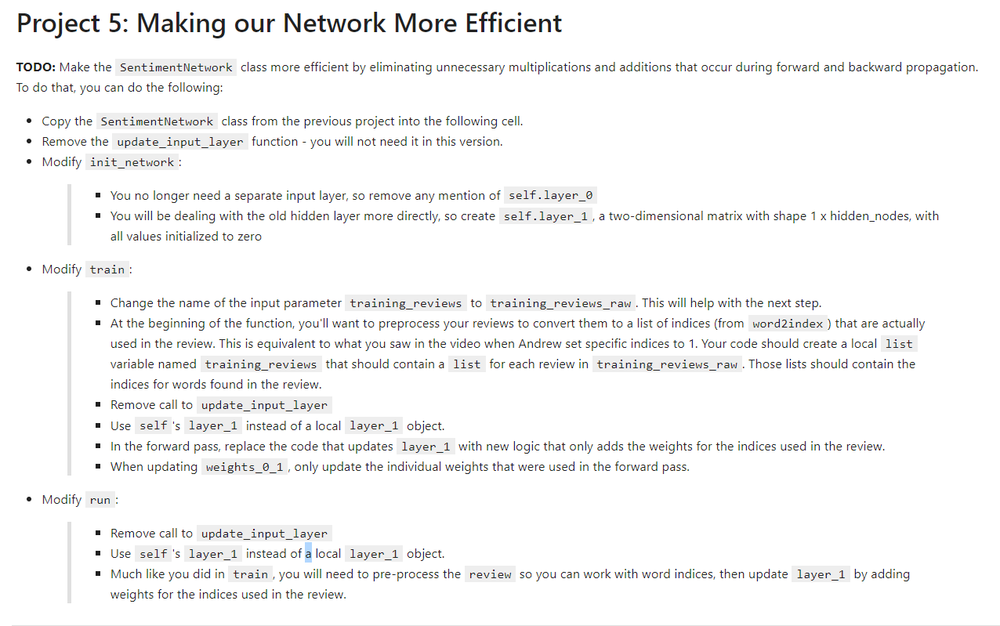

In [118]:
Image(filename='img_3.png')

In [205]:
import time
import sys
import numpy as np

class SentimentNetwork:
    def __init__(self, reviews, labels, hidden_nodes = 10, learning_rate = 0.1):
        """Create a SentimenNetwork with the given settings
        Args:
            reviews(list) - List of reviews used for training
            labels(list) - List of POSITIVE/NEGATIVE labels associated with the given reviews
            hidden_nodes(int) - Number of nodes to create in the hidden layer
            learning_rate(float) - Learning rate to use while training

        """
        # Assign a seed to our random number generator to ensure we get
        # reproducible results during development
        np.random.seed(1)

        # process the reviews and their associated labels so that everything
        # is ready for training
        self.pre_process_data(reviews, labels)

        # Build the network to have the number of hidden nodes and the learning rate that
        # were passed into this initializer. Make the same number of input nodes as
        # there are vocabulary words and create a single output node.
        self.init_network(len(self.review_vocab),hidden_nodes, 1, learning_rate)

    def pre_process_data(self, reviews, labels):

        review_vocab = set()

        # TODO: populate review_vocab with all of the words in the given reviews
        #       Remember to split reviews into individual words
        #       using "split(' ')" instead of "split()".

        for review in reviews:
            for word in review.split(' '):
                review_vocab.add(word)

        # Convert the vocabulary set to a list so we can access words via indices
        self.review_vocab = list(review_vocab)

        label_vocab = set()

        # TODO: populate label_vocab with all of the words in the given labels.
        #       There is no need to split the labels because each one is a single word.

        for label in labels:
            label_vocab.add(label)

        # Convert the label vocabulary set to a list so we can access labels via indices
        self.label_vocab = list(label_vocab)

        # Store the sizes of the review and label vocabularies.
        self.review_vocab_size = len(self.review_vocab)
        self.label_vocab_size = len(self.label_vocab)

        # Create a dictionary of words in the vocabulary mapped to index positions
        self.word2index = {}

        # TODO: populate self.word2index with indices for all the words in self.review_vocab
        #       like you saw earlier in the notebook
        for i, word in enumerate(self.review_vocab):
            self.word2index[word] = i

        # Create a dictionary of labels mapped to index positions
        self.label2index = {}

        # TODO: do the same thing you did for self.word2index and self.review_vocab,
        #       but for self.label2index and self.label_vocab instead

        for i, word in enumerate(self.label_vocab):
            self.label2index[word] = i

    def init_network(self,input_nodes,hidden_nodes,output_nodes,learning_rate):
        # Store the number of nodes in input, hidden, and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Store the learning rate
        self.learning_rate = learning_rate

        # Initialize weights

        # TODO: initialize self.weights_0_1 as a matrix of zeros. These are the weights between
        #       the input layer and the hidden layer.

        self.weights_0_1 = np.zeros((self.input_nodes,self.hidden_nodes))

        # TODO: initialize self.weights_1_2 as a matrix of random values.
        #       These are the weights between the hidden layer and the output layer.
        self.weights_1_2 = np.random.randn(self.hidden_nodes,self.output_nodes)

        # TODO: Create the input layer, a two-dimensional matrix with shape
        #       1 x input_nodes, with all values initialized to zero
        # self.layer_0 = np.zeros((1,input_nodes))

        self.layer_1 = np.zeros((1,self.hidden_nodes))

    # def update_input_layer(self,review):
    #
    #     # clear out the previous state, reset the layer to be all 0s
    #     self.layer_0 *= 0
    #
    #     for word in review.split(" "):
    #         # NOTE: This if-check was not in the version of this method created in Project 2,
    #         #       and it appears in Andrew's Project 3 solution without explanation.
    #         #       It simply ensures the word is actually a key in word2index before
    #         #       accessing it, which is important because accessing an invalid key
    #         #       with raise an exception in Python. This allows us to ignore unknown
    #         #       words encountered in new reviews.
    #         if(word in self.word2index.keys()):
    #             self.layer_0[0][self.word2index[word]] = 1

    def get_target_for_label(self,label):

        if(label == 'POSITIVE'):
            return 1
        else:
            return 0

    def sigmoid(self,x):
        return 1 / (1 + np.exp(-x))

    def sigmoid_output_2_derivative(self,output):
        return output * (1-output)

    def train(self, training_reviews_raw, training_labels):

        training_reviews = []

        for review in training_reviews_raw:
            indices = set()
            for word in review.split(" "):
                if word in self.word2index.keys():
                    indices.add(self.word2index[word])
            training_reviews.append(list(indices))

        # make sure out we have a matching number of reviews and labels
        assert(len(training_reviews) == len(training_labels))

        # Keep track of correct predictions to display accuracy during training
        correct_so_far = 0

        # Remember when we started for printing time statistics
        start = time.time()

        # loop through all the given reviews and run a forward and backward pass,
        # updating weights for every item

        for i in range(len(training_reviews)):

            # TODO: Get the next review and its correct label

            review = training_reviews[i]
            label = training_labels[i]

            # TODO: Implement the forward pass through the network.
            #       That means use the given review to update the input layer,
            #       then calculate values for the hidden layer,
            #       and finally calculate the output layer.
            #
            #       Do not use an activation function for the hidden layer,
            #       but use the sigmoid activation function for the output layer.

            # Input layer
            # self.update_input_layer(review)

            # Hidden layer
            self.layer_1 *=0

            for index in review:
                self.layer_1 += self.weights_0_1[index]

            # Ouput layer
            layer_2 = self.sigmoid(np.dot(self.layer_1,self.weights_1_2))

            # TODO: Implement the back propagation pass here.
            #       That means calculate the error for the forward pass's prediction
            #       and update the weights in the network according to their
            #       contributions toward the error, as calculated via the
            #       gradient descent and back propagation algorithms you
            #       learned in class.

            # Output error
            layer_2_error = layer_2 - self.get_target_for_label(label) # Output layer error is the difference
            layer_2_delta = layer_2_error * self.sigmoid_output_2_derivative(layer_2)

            # Backpropagated error
            layer_1_error = np.dot(layer_2_delta,self.weights_1_2.T) # errors propagated in the hidden layer_0
            layer_1_delta = layer_1_error # hidden layer gradients - no nonlinearity so it's the same

            # Update the weights
            self.weights_1_2 -= self.layer_1.T.dot(layer_2_delta) * self.learning_rate # update hidden-to-output weights with gradient descent step
            ## New for Project 5: Only update the weights that were used in the forward pass
            for index in review:
                self.weights_0_1[index] -= layer_1_delta[0] * self.learning_rate # update input-to-hidden weights with gradient descent

            # TODO: Keep track of correct predictions. To determine if the prediction was
            #       correct, check that the absolute value of the output error
            #       is less than 0.5. If so, add one to the correct_so_far count.

            if layer_2 > 0.5 and label == 'POSITIVE':
                correct_so_far += 1
            if layer_2 < 0.5 and label =='NEGATIVE':
                correct_so_far += 1

            # For debug purposes, print out our prediction accuracy and speed
            # throughout the training process.

            elapsed_time = float(time.time() - start)
            reviews_per_second = i/elapsed_time if elapsed_time > 0 else 0

            sys.stdout.write("\nProgress:" + str(100 * i/float(len(training_reviews)))[:4] \
                             + '%Speed(reviews.sec):' + str(reviews_per_second)[0:5] \
                             + '#Correct:' + str(correct_so_far) + '#Trained:' + str(i+1) \
                             + 'Training Accyracy:' + str(correct_so_far * 100 / float(i+1))[:4]+ '%')
            if i%2500 == 0:

                print("")

    def test(self,testing_reviews,testing_labels):

        """
        Attempts to predict the labels for the given testing_reviews,
        and uses the test_labels to calculate the accuracy of those predictions.
        """

        # keep track of how many correct predictions we make
        correct = 0

        start = time.time()

        # loop through each of the review and call run to predict the label

        for i in range(len(testing_reviews)):
            pred = self.run(testing_reviews[i])
            if pred == testing_labels[i]:
                correct += 1

            # For debug purposes, print out our prediction accuracy and speed
            # throughout the prediction process.

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0

            sys.stdout.write("\rProgress:" + str(100 * i/float(len(testing_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct) + " #Tested:" + str(i+1) \
                             + " Testing Accuracy:" + str(correct * 100 / float(i+1))[:4] + "%")
    def run(self, review):
        """
        Returns a POSITIVE or NEGATIVE prediction for the given review.
        """
        # TODO: Run a forward pass through the network, like you did in the
        #       "train" function. That means use the given review to
        #       update the input layer, then calculate values for the hidden layer,
        #       and finally calculate the output layer.
        #
        #       Note: The review passed into this function for prediction
        #             might come from anywhere, so you should convert it
        #             to lower case prior to using it.

        self.layer_1 *= 0
        unique_indices = set()
        for word in review.lower().split(" "):
            if word in self.word2index.keys():
                unique_indices.add(self.word2index[word])

        for index in unique_indices:
            self.layer_1 += self.weights_0_1[index]

        # Ouput layer
        layer_2 = self.sigmoid(np.dot(self.layer_1,self.weights_1_2))

        # TODO: The output layer should now contain a prediction.
        #       Return `POSITIVE` for predictions greater-than-or-equal-to `0.5`,
        #       and `NEGATIVE` otherwise.

        # Return POSITIVE for values above greater-than-or-equal-to 0.5 in the output layer;
        # return NEGATIVE for other values
        if layer_2[0] >= 0.5:
            return "POSITIVE"
        else:
            return "NEGATIVE"


In [206]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.1)
mlp.train(reviews[:-1000],labels[:-1000])


Progress:0.0%Speed(reviews.sec):0#Correct:0#Trained:1Training Accyracy:0.0%

Progress:0.00%Speed(reviews.sec):999.8#Correct:0#Trained:2Training Accyracy:0.0%
Progress:0.00%Speed(reviews.sec):999.9#Correct:1#Trained:3Training Accyracy:33.3%
Progress:0.01%Speed(reviews.sec):749.8#Correct:1#Trained:4Training Accyracy:25.0%
Progress:0.01%Speed(reviews.sec):999.7#Correct:2#Trained:5Training Accyracy:40.0%
Progress:0.02%Speed(reviews.sec):999.8#Correct:2#Trained:6Training Accyracy:33.3%
Progress:0.02%Speed(reviews.sec):1199.#Correct:2#Trained:7Training Accyracy:28.5%
Progress:0.02%Speed(reviews.sec):1399.#Correct:2#Trained:8Training Accyracy:25.0%
Progress:0.03%Speed(reviews.sec):1333.#Correct:3#Trained:9Training Accyracy:33.3%
Progress:0.03%Speed(reviews.sec):1285.#Correct:3#Trained:10Training Accyracy:30.0%
Progress:0.04%Speed(reviews.sec):1428.#Correct:4#Trained:11Training Accyracy:36.3%
Progress:0.04%Speed(reviews.sec):1374.#Correct:4#Trained:12Training Accyracy:33.3%
Progress:0.05%Spee

In [207]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:99.9% Speed(reviews/sec):2728. #Correct:844 #Tested:1000 Testing Accuracy:84.4%

In [211]:
pos_neg_ratios.most_common()

[('edie', 4.6913478822291435),
 ('paulie', 4.07753744390572),
 ('felix', 3.152736022363656),
 ('polanski', 2.8233610476132043),
 ('matthau', 2.80672172860924),
 ('victoria', 2.681021528714291),
 ('mildred', 2.6026896854443837),
 ('gandhi', 2.538973871058276),
 ('flawless', 2.451005098112319),
 ('superbly', 2.26002547857525),
 ('perfection', 2.159484249353372),
 ('astaire', 2.1400661634962708),
 ('captures', 2.038619547159581),
 ('voight', 2.030170492673053),
 ('wonderfully', 2.0218960560332353),
 ('powell', 1.978345424808467),
 ('brosnan', 1.9547990964725592),
 ('lily', 1.9203768470501485),
 ('bakshi', 1.9029851043382795),
 ('lincoln', 1.9014583864844796),
 ('refreshing', 1.8551812956655511),
 ('breathtaking', 1.8481124057791867),
 ('bourne', 1.8478489358790986),
 ('lemmon', 1.8458266904983307),
 ('delightful', 1.8002701588959635),
 ('flynn', 1.7996646487351682),
 ('andrews', 1.7764919970972666),
 ('homer', 1.7692866133759964),
 ('beautifully', 1.7626953362841438),
 ('soccer', 1.757857

In [212]:
# words most frequently seen in a review with a "NEGATIVE" label
list(reversed(pos_neg_ratios.most_common()))[0:30]

[('boll', -4.07781526027089),
 ('uwe', -3.921875301871158),
 ('seagal', -3.320250105858192),
 ('unwatchable', -3.0269848170580955),
 ('stinker', -2.9876839403711624),
 ('mst', -2.775383321170797),
 ('incoherent', -2.7641396677532537),
 ('unfunny', -2.5545257844967644),
 ('waste', -2.4907515123361046),
 ('blah', -2.4475792789485005),
 ('horrid', -2.371577964480997),
 ('pointless', -2.345107387713634),
 ('atrocious', -2.3187369339642556),
 ('redeeming', -2.2667790015910296),
 ('prom', -2.2601040980178784),
 ('drivel', -2.247602958576693),
 ('lousy', -2.2118080125207054),
 ('worst', -2.1930856334332267),
 ('laughable', -2.172468615469592),
 ('awful', -2.1385076866397488),
 ('poorly', -2.132613384420701),
 ('wasting', -2.117815554561451),
 ('remotely', -2.111046881095167),
 ('existent', -2.0024805005437076),
 ('boredom', -1.9241486572738005),
 ('miserably', -1.921661093801999),
 ('sucks', -1.9166645809588516),
 ('uninspired', -1.9131499212248517),
 ('lame', -1.9117232884159072),
 ('insult'

In [241]:
from bokeh.models import ColumnDataSource, LabelSet
from bokeh.plotting import figure, show, output_file
from bokeh.io import output_notebook
output_notebook()

Loading BokehJS ...

In [242]:
hist,edges = np.histogram(list(map(lambda x:x[1],pos_neg_ratios.most_common())), density=True, bins=100,normed=True)

p = figure(tools="pan,wheel_zoom,reset,save",
           toolbar_location = 'above',
           title='word positive/ negativ affinity distribution')
p.quad(top=hist,bottom=0,left=edges[:-1],right=edges[1:], line_color='#555555')
show(p)

C:\Users\Andrei\AppData\Local\Temp\ipykernel_20292\4057008850.py:1: DeprecationWarning: The normed argument is ignored when density is provided. In future passing both will result in an error.
  hist,edges = np.histogram(list(map(lambda x:x[1],pos_neg_ratios.most_common())), density=True, bins=100,normed=True)


In [216]:
frequency_frequency = Counter()

for word, cnt in total_counts.most_common():
    frequency_frequency[cnt] += 1

In [220]:
hist,edges = np.histogram(list(map(lambda x:x[1],frequency_frequency.most_common())), density=True, bins=100,normed=True)

p = figure(tools="pan,wheel_zoom,reset,save",
           toolbar_location = 'above',
           title='word positive/ negativ affinity distribution')
p.quad(top=hist,bottom=0,left=edges[:-1],right=edges[1:], line_color='#555555')
show(p)

C:\Users\Andrei\AppData\Local\Temp\ipykernel_20292\2762073897.py:1: DeprecationWarning: The normed argument is ignored when density is provided. In future passing both will result in an error.
  hist,edges = np.histogram(list(map(lambda x:x[1],frequency_frequency.most_common())), density=True, bins=100,normed=True)


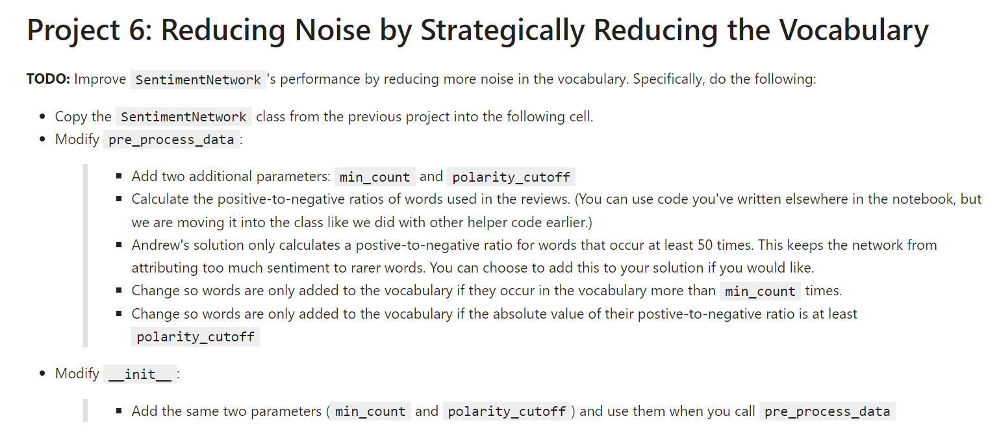

In [221]:
Image(filename='img_4.png')

In [223]:
import time
import sys
import numpy as np

class SentimentNetwork:
    def __init__(self, reviews, labels, hidden_nodes = 10, learning_rate = 0.1, min_count= 10, polarity_cutoff = 0.1):
        """Create a SentimenNetwork with the given settings
        Args:
            reviews(list) - List of reviews used for training
            labels(list) - List of POSITIVE/NEGATIVE labels associated with the given reviews
            hidden_nodes(int) - Number of nodes to create in the hidden layer
            learning_rate(float) - Learning rate to use while training

        """
        # Assign a seed to our random number generator to ensure we get
        # reproducible results during development
        np.random.seed(1)

        # process the reviews and their associated labels so that everything
        # is ready for training
        self.pre_process_data(reviews, labels, min_count, polarity_cutoff)

        # Build the network to have the number of hidden nodes and the learning rate that
        # were passed into this initializer. Make the same number of input nodes as
        # there are vocabulary words and create a single output node.
        self.init_network(len(self.review_vocab),hidden_nodes, 1, learning_rate)

    def pre_process_data(self, reviews, labels, min_count, polarity_cutoff):

        positive_counts = Counter()
        negative_counts = Counter()
        total_counts = Counter()

        for i in range(len(reviews)):
            if(labels[i] == 'POSITIVE'):
                for word in reviews[i].split(" "):
                    positive_counts[word] += 1
                    total_counts[word] += 1
            else:
                for word in reviews[i].split(" "):
                    negative_counts[word] += 1
                    total_counts[word] += 1

        pos_neg_ratios = Counter()

        for term,cnt in list(total_counts.most_common()):
            if(cnt >= 50):
                pos_neg_ratio = positive_counts[term] / float(negative_counts[term]+1)
                pos_neg_ratios[term] = pos_neg_ratio

        for word,ratio in pos_neg_ratios.most_common():
            if(ratio > 1):
                pos_neg_ratios[word] = np.log(ratio)
            else:
                pos_neg_ratios[word] = -np.log((1 / (ratio + 0.01)))

        review_vocab = set()

        # TODO: populate review_vocab with all of the words in the given reviews
        #       Remember to split reviews into individual words
        #       using "split(' ')" instead of "split()".

        for review in reviews:
            for word in review.split(' '):
                if total_counts[word] > min_count:
                    if word in pos_neg_ratios.keys():
                        if(pos_neg_ratios[word] >= polarity_cutoff or pos_neg_ratios[word] <= -polarity_cutoff):
                            review_vocab.add(word)
                    else:
                        review_vocab.add(word)

        # Convert the vocabulary set to a list so we can access words via indices
        self.review_vocab = list(review_vocab)

        label_vocab = set()

        # TODO: populate label_vocab with all of the words in the given labels.
        #       There is no need to split the labels because each one is a single word.

        for label in labels:
            label_vocab.add(label)

        # Convert the label vocabulary set to a list so we can access labels via indices
        self.label_vocab = list(label_vocab)

        # Store the sizes of the review and label vocabularies.
        self.review_vocab_size = len(self.review_vocab)
        self.label_vocab_size = len(self.label_vocab)

        # Create a dictionary of words in the vocabulary mapped to index positions
        self.word2index = {}

        # TODO: populate self.word2index with indices for all the words in self.review_vocab
        #       like you saw earlier in the notebook
        for i, word in enumerate(self.review_vocab):
            self.word2index[word] = i

        # Create a dictionary of labels mapped to index positions
        self.label2index = {}

        # TODO: do the same thing you did for self.word2index and self.review_vocab,
        #       but for self.label2index and self.label_vocab instead

        for i, word in enumerate(self.label_vocab):
            self.label2index[word] = i

    def init_network(self,input_nodes,hidden_nodes,output_nodes,learning_rate):
        # Store the number of nodes in input, hidden, and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Store the learning rate
        self.learning_rate = learning_rate

        # Initialize weights

        # TODO: initialize self.weights_0_1 as a matrix of zeros. These are the weights between
        #       the input layer and the hidden layer.

        self.weights_0_1 = np.zeros((self.input_nodes,self.hidden_nodes))

        # TODO: initialize self.weights_1_2 as a matrix of random values.
        #       These are the weights between the hidden layer and the output layer.
        self.weights_1_2 = np.random.randn(self.hidden_nodes,self.output_nodes)

        # TODO: Create the input layer, a two-dimensional matrix with shape
        #       1 x input_nodes, with all values initialized to zero
        # self.layer_0 = np.zeros((1,input_nodes))

        self.layer_1 = np.zeros((1,self.hidden_nodes))

    # def update_input_layer(self,review):
    #
    #     # clear out the previous state, reset the layer to be all 0s
    #     self.layer_0 *= 0
    #
    #     for word in review.split(" "):
    #         # NOTE: This if-check was not in the version of this method created in Project 2,
    #         #       and it appears in Andrew's Project 3 solution without explanation.
    #         #       It simply ensures the word is actually a key in word2index before
    #         #       accessing it, which is important because accessing an invalid key
    #         #       with raise an exception in Python. This allows us to ignore unknown
    #         #       words encountered in new reviews.
    #         if(word in self.word2index.keys()):
    #             self.layer_0[0][self.word2index[word]] = 1

    def get_target_for_label(self,label):

        if(label == 'POSITIVE'):
            return 1
        else:
            return 0

    def sigmoid(self,x):
        return 1 / (1 + np.exp(-x))

    def sigmoid_output_2_derivative(self,output):
        return output * (1-output)

    def train(self, training_reviews_raw, training_labels):

        training_reviews = []

        for review in training_reviews_raw:
            indices = set()
            for word in review.split(" "):
                if word in self.word2index.keys():
                    indices.add(self.word2index[word])
            training_reviews.append(list(indices))

        # make sure out we have a matching number of reviews and labels
        assert(len(training_reviews) == len(training_labels))

        # Keep track of correct predictions to display accuracy during training
        correct_so_far = 0

        # Remember when we started for printing time statistics
        start = time.time()

        # loop through all the given reviews and run a forward and backward pass,
        # updating weights for every item

        for i in range(len(training_reviews)):

            # TODO: Get the next review and its correct label

            review = training_reviews[i]
            label = training_labels[i]

            # TODO: Implement the forward pass through the network.
            #       That means use the given review to update the input layer,
            #       then calculate values for the hidden layer,
            #       and finally calculate the output layer.
            #
            #       Do not use an activation function for the hidden layer,
            #       but use the sigmoid activation function for the output layer.

            # Input layer
            # self.update_input_layer(review)

            # Hidden layer
            self.layer_1 *=0

            for index in review:
                self.layer_1 += self.weights_0_1[index]

            # Ouput layer
            layer_2 = self.sigmoid(np.dot(self.layer_1,self.weights_1_2))

            # TODO: Implement the back propagation pass here.
            #       That means calculate the error for the forward pass's prediction
            #       and update the weights in the network according to their
            #       contributions toward the error, as calculated via the
            #       gradient descent and back propagation algorithms you
            #       learned in class.

            # Output error
            layer_2_error = layer_2 - self.get_target_for_label(label) # Output layer error is the difference
            layer_2_delta = layer_2_error * self.sigmoid_output_2_derivative(layer_2)

            # Backpropagated error
            layer_1_error = np.dot(layer_2_delta,self.weights_1_2.T) # errors propagated in the hidden layer_0
            layer_1_delta = layer_1_error # hidden layer gradients - no nonlinearity so it's the same

            # Update the weights
            self.weights_1_2 -= self.layer_1.T.dot(layer_2_delta) * self.learning_rate # update hidden-to-output weights with gradient descent step
            ## New for Project 5: Only update the weights that were used in the forward pass
            for index in review:
                self.weights_0_1[index] -= layer_1_delta[0] * self.learning_rate # update input-to-hidden weights with gradient descent

            # TODO: Keep track of correct predictions. To determine if the prediction was
            #       correct, check that the absolute value of the output error
            #       is less than 0.5. If so, add one to the correct_so_far count.

            if layer_2 > 0.5 and label == 'POSITIVE':
                correct_so_far += 1
            if layer_2 < 0.5 and label =='NEGATIVE':
                correct_so_far += 1

            # For debug purposes, print out our prediction accuracy and speed
            # throughout the training process.

            elapsed_time = float(time.time() - start)
            reviews_per_second = i/elapsed_time if elapsed_time > 0 else 0

            sys.stdout.write("\nProgress:" + str(100 * i/float(len(training_reviews)))[:4] \
                             + '%Speed(reviews.sec):' + str(reviews_per_second)[0:5] \
                             + '#Correct:' + str(correct_so_far) + '#Trained:' + str(i+1) \
                             + 'Training Accyracy:' + str(correct_so_far * 100 / float(i+1))[:4]+ '%')
            if i%2500 == 0:

                print("")

    def test(self,testing_reviews,testing_labels):

        """
        Attempts to predict the labels for the given testing_reviews,
        and uses the test_labels to calculate the accuracy of those predictions.
        """

        # keep track of how many correct predictions we make
        correct = 0

        start = time.time()

        # loop through each of the review and call run to predict the label

        for i in range(len(testing_reviews)):
            pred = self.run(testing_reviews[i])
            if pred == testing_labels[i]:
                correct += 1

            # For debug purposes, print out our prediction accuracy and speed
            # throughout the prediction process.

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0

            sys.stdout.write("\rProgress:" + str(100 * i/float(len(testing_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct) + " #Tested:" + str(i+1) \
                             + " Testing Accuracy:" + str(correct * 100 / float(i+1))[:4] + "%")
    def run(self, review):
        """
        Returns a POSITIVE or NEGATIVE prediction for the given review.
        """
        # TODO: Run a forward pass through the network, like you did in the
        #       "train" function. That means use the given review to
        #       update the input layer, then calculate values for the hidden layer,
        #       and finally calculate the output layer.
        #
        #       Note: The review passed into this function for prediction
        #             might come from anywhere, so you should convert it
        #             to lower case prior to using it.

        self.layer_1 *= 0
        unique_indices = set()
        for word in review.lower().split(" "):
            if word in self.word2index.keys():
                unique_indices.add(self.word2index[word])

        for index in unique_indices:
            self.layer_1 += self.weights_0_1[index]

        # Ouput layer
        layer_2 = self.sigmoid(np.dot(self.layer_1,self.weights_1_2))

        # TODO: The output layer should now contain a prediction.
        #       Return `POSITIVE` for predictions greater-than-or-equal-to `0.5`,
        #       and `NEGATIVE` otherwise.

        # Return POSITIVE for values above greater-than-or-equal-to 0.5 in the output layer;
        # return NEGATIVE for other values
        if layer_2[0] >= 0.5:
            return "POSITIVE"
        else:
            return "NEGATIVE"


In [224]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000],min_count=20,polarity_cutoff=0.05,learning_rate=0.01)
mlp.train(reviews[:-1000],labels[:-1000])


Progress:0.0%Speed(reviews.sec):0.0#Correct:0#Trained:1Training Accyracy:0.0%

Progress:0.00%Speed(reviews.sec):1000.#Correct:0#Trained:2Training Accyracy:0.0%
Progress:0.00%Speed(reviews.sec):999.9#Correct:0#Trained:3Training Accyracy:0.0%
Progress:0.01%Speed(reviews.sec):999.9#Correct:0#Trained:4Training Accyracy:0.0%
Progress:0.01%Speed(reviews.sec):999.8#Correct:0#Trained:5Training Accyracy:0.0%
Progress:0.02%Speed(reviews.sec):1249.#Correct:0#Trained:6Training Accyracy:0.0%
Progress:0.02%Speed(reviews.sec):1499.#Correct:0#Trained:7Training Accyracy:0.0%
Progress:0.02%Speed(reviews.sec):1399.#Correct:1#Trained:8Training Accyracy:12.5%
Progress:0.03%Speed(reviews.sec):1599.#Correct:1#Trained:9Training Accyracy:11.1%
Progress:0.03%Speed(reviews.sec):1499.#Correct:2#Trained:10Training Accyracy:20.0%
Progress:0.04%Speed(reviews.sec):1666.#Correct:2#Trained:11Training Accyracy:18.1%
Progress:0.04%Speed(reviews.sec):1832.#Correct:2#Trained:12Training Accyracy:16.6%
Progress:0.05%Speed(r

In [225]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:99.9% Speed(reviews/sec):3362. #Correct:859 #Tested:1000 Testing Accuracy:85.9%

In [227]:
def get_most_similar_words(focus = "horrible"):
    most_similar = Counter()

    for word in mlp.word2index.keys():
        most_similar[word] = np.dot(mlp.weights_0_1[mlp.word2index[word]],mlp.weights_0_1[mlp.word2index[focus]])

    return most_similar.most_common()

In [231]:
mlp.weights_0_1

array([[ 4.69913244e-03, -1.76977413e-03, -1.52796879e-03, ...,
        -2.20212531e-03,  9.22960719e-04, -7.21413344e-04],
       [-6.85135020e-03,  2.58033637e-03,  2.22778340e-03, ...,
         3.21070578e-03, -1.34567970e-03,  1.05182297e-03],
       [-9.81544790e-04,  3.69666657e-04,  3.19158871e-04, ...,
         4.59975252e-04, -1.92786072e-04,  1.50687285e-04],
       ...,
       [-6.60135619e-03,  2.48618433e-03,  2.14649541e-03, ...,
         3.09355264e-03, -1.29657815e-03,  1.01344376e-03],
       [ 5.47161714e-04, -2.06070516e-04, -1.77914973e-04, ...,
        -2.56413003e-04,  1.07468512e-04, -8.40005611e-05],
       [ 2.21138428e-02, -8.32845371e-03, -7.19053187e-03, ...,
        -1.03630731e-02,  4.34339924e-03, -3.39492906e-03]])

In [233]:
mlp.word2index['amazing']

4827

In [232]:
mlp.weights_0_1[mlp.word2index['amazing']]

array([ 0.10889122, -0.04101031, -0.03540704, -0.07192859,  0.05801432,
       -0.15428823,  0.11696693, -0.05102902,  0.02138742, -0.01671704])

In [234]:
np.dot(mlp.weights_0_1[mlp.word2index['perfect']],mlp.weights_0_1[mlp.word2index['amazing']])

0.08490500994179018

In [229]:
get_most_similar_words("excellent")

[('perfect', 0.11029288167915642),
 ('excellent', 0.10826471175797381),
 ('amazing', 0.08334369624048907),
 ('wonderful', 0.07753982807785914),
 ('great', 0.07608085722239442),
 ('today', 0.07445287968719352),
 ('fun', 0.07218604878035606),
 ('definitely', 0.07091728043659026),
 ('liked', 0.07007892475777469),
 ('best', 0.06983227108195625),
 ('loved', 0.06417326637628823),
 ('superb', 0.06262534012278852),
 ('fantastic', 0.062012778223762124),
 ('favorite', 0.061428280115519256),
 ('incredible', 0.05986925643229068),
 ('rare', 0.059242773125523084),
 ('brilliant', 0.059211347015624916),
 ('enjoyable', 0.058861580834150475),
 ('perfectly', 0.055117069828364305),
 ('enjoyed', 0.0546294120791582),
 ('highly', 0.054007463083128635),
 ('refreshing', 0.05336764714834943),
 ('masterpiece', 0.05146194712426491),
 ('gem', 0.051393246405596844),
 ('beautiful', 0.05095315747559439),
 ('solid', 0.0507435486997407),
 ('bit', 0.050264676448476195),
 ('job', 0.05002055767685748),
 ('noir', 0.0498536

In [230]:
get_most_similar_words("terrible")

[('worst', 0.15540013931104293),
 ('awful', 0.11980831026759009),
 ('waste', 0.11435081857888958),
 ('terrible', 0.0892765421065334),
 ('poor', 0.08749354724298572),
 ('dull', 0.08639552499141202),
 ('disappointment', 0.08154322613019334),
 ('poorly', 0.07917753162480938),
 ('disappointing', 0.07767920620015964),
 ('fails', 0.07621389887342021),
 ('boring', 0.07435170360172463),
 ('worse', 0.07059217037312382),
 ('unfortunately', 0.06890617349088707),
 ('mess', 0.06884268764998111),
 ('annoying', 0.06723639292864807),
 ('wasted', 0.06613198326465487),
 ('badly', 0.06545154189736503),
 ('bad', 0.06469309710032545),
 ('horrible', 0.06254228631789456),
 ('save', 0.061543755971917136),
 ('stupid', 0.060605925995036794),
 ('disappointed', 0.06055124819313929),
 ('laughable', 0.060215584666538605),
 ('supposed', 0.0586238346633042),
 ('ridiculous', 0.05747857076587311),
 ('avoid', 0.055701783612275506),
 ('nothing', 0.05544353145523124),
 ('pointless', 0.05397310321971473),
 ('unless', 0.053

In [236]:
import matplotlib.colors as colors

words_to_visualize = list()
for word, ratio in pos_neg_ratios.most_common(500):
    if(word in mlp.word2index.keys()):
        words_to_visualize.append(word)

for word, ratio in list(reversed(pos_neg_ratios.most_common()))[0:500]:
    if(word in mlp.word2index.keys()):
        words_to_visualize.append(word)

In [238]:
pos = 0
neg = 0

colors_list = list()
vectors_list = list()
for word in words_to_visualize:
    if word in pos_neg_ratios.keys():
        vectors_list.append(mlp.weights_0_1[mlp.word2index[word]])
        if(pos_neg_ratios[word] > 0):
            pos+=1
            colors_list.append("#00ff00")
        else:
            neg+=1
            colors_list.append("#000000")

In [245]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, random_state=0)
words_top_ted_tsne = tsne.fit_transform(np.array(vectors_list))

D:\ComputerVision\venv\lib\site-packages\sklearn\manifold\_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
D:\ComputerVision\venv\lib\site-packages\sklearn\manifold\_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


In [247]:
p = figure(tools="pan,wheel_zoom,reset,save",
           toolbar_location="above",
           title="vector T-SNE for most polarized words")

source = ColumnDataSource(data=dict(x1=words_top_ted_tsne[:,0],
                                    x2=words_top_ted_tsne[:,1],
                                    names=words_to_visualize,
                                    color=colors_list))

p.scatter(x="x1", y="x2", size=8, source=source, fill_color="color")

word_labels = LabelSet(x="x1", y="x2", text="names", y_offset=6,
                  text_font_size="8pt", text_color="#555555",
                  source=source, text_align='center')
# p.add_layout(word_labels)

show(p)